In [ ]:
!pip install plotly

In [ ]:
!pip install statsmodels

In [ ]:
!pip install missingno

In [ ]:
!pip install lightgbm

In [ ]:
!pip install mlxtend

## Import the required Libraries

In [ ]:
import pandas as pd
import re
import os
import numpy as np
import datetime
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import train_test_split, RandomizedSearchCV

In [ ]:
import zipfile
import os

# Define the folder name
extract_folder = "/content/Project/scrapped_data"

# Create the folder if it doesn't exist
os.makedirs(extract_folder, exist_ok=True)

# Extract the zip file
with zipfile.ZipFile("raw.zip", "r") as zip_ref:
    zip_ref.extractall(extract_folder)

print(f"Files extracted to '{extract_folder}' successfully!")


## Merge Files

In [ ]:

raw_data_folder = '/content/Project/scrapped_data'  # Folder containing extracted data
merged_data_folder = '/content/Project/Data/merged'  # Folder to save merged data


if not os.path.exists(merged_data_folder):
    os.makedirs(merged_data_folder)


dataframes = []

# Loop through the files in the raw data folder
for file_name in os.listdir(raw_data_folder):
    if file_name.endswith('.csv'):
        file_path = os.path.join(raw_data_folder, file_name)

        df = pd.read_csv(file_path)
        dataframes.append(df)

# Concatenate all dataframes and keep only one header
merged_df = pd.concat(dataframes, ignore_index=True)


merged_file_path = os.path.join(merged_data_folder, 'merged_data.csv')


merged_df.to_csv(merged_file_path, index=False)

# Output the merged file path
print(f'Merged file saved at: {merged_file_path}')

Merged file saved at: /Users/kaushikmanjunatha/Documents/Project/Data/merged/merged_data.csv


## Data Pre Processing

In [ ]:

df = pd.read_csv('/content/Project/Data/merged/merged_data.csv')

# Remove rows where "Car Name" is blank (NaN or empty string)
df = df[df['Car Name'].notna() & df['Car Name'].str.strip().ne('')]


df.to_csv('/content/Project/Data/merged/cleaned_merged_data.csv', index=False)


In [ ]:
df.shape

(15525, 10)

In [ ]:
df = pd.read_csv('/content/Project/Data/merged/cleaned_merged_data.csv')

In [ ]:

# Extract the year from 'Car Name'
df['Year'] = df['Car Name'].apply(lambda x: re.search(r'\b(19|20)\d{2}\b', x).group() if pd.notna(x) and re.search(r'\b(19|20)\d{2}\b', x) else 'Unknown')

# Extract the make and model from 'Car Name'
def extract_make_model(car_name):
    if pd.isna(car_name):  # Handle NaN cases in Car Name
        return 'Unknown', 'Unknown'

    parts = car_name.split()

    if len(parts) < 3:
        return ('Unknown', 'Unknown')

    make = parts[1]
    model = ' '.join(parts[2:])

    return make, model


df['Make'], df['Model'] = zip(*df['Car Name'].apply(extract_make_model))

# calculate (current year - car make year)
current_year = datetime.datetime.now().year

# cases where the year is not 'Unknown'
df['Age'] = df['Year'].apply(lambda x: current_year - int(x) if x.isdigit() else 'Unknown')

#  Replace non-numeric prices like 'Not Priced' with NaN, then convert 'Price' column to numeric format
df['Price_usd'] = pd.to_numeric(df['Price'].replace({'\$': '', ',': ''}, regex=True).replace('Not Priced', pd.NA), errors='coerce')

#  Convert 'Reviews' column to numeric format, remove the "reviews" text
df['Reviews'] = pd.to_numeric(df['Reviews'].replace({' reviews': '', ',': ''}, regex=True), errors='coerce')

# Convert 'Mileage' column to numeric format, remove "mi." text
df['Mileage_miles'] = pd.to_numeric(df['Mileage'].replace({' mi.': '', ',': ''}, regex=True), errors='coerce')

# Split 'Location' into 'County', 'State', and 'Distance'
df[['County', 'State_Distance']] = df['Location'].str.split(',', expand=True)
df[['State', 'Distance']] = df['State_Distance'].str.extract(r'(\w{2})\s\((\d+)\smi\.\)')
df['Distance'] = pd.to_numeric(df['Distance'], errors='coerce')  # Convert Distance to numeric


df.drop(columns=['State_Distance'], inplace=True)


df.to_csv('/content/Project/Data/processed_data.csv', index=False)


print(df[['Car Name', 'Year', 'Age']].head())


                                  Car Name  Year  Age
0                   2018 Ford F-150 Raptor  2018    6
1  2022 Jeep Wrangler Unlimited 4xe Sahara  2022    2
2    2017 Volvo XC90 Hybrid T8 Inscription  2017    7
3              2023 Toyota Sequoia TRD Pro  2023    1
4              2019 Mercedes-Benz GLC 350e  2019    5


Missing values

In [ ]:
df.isnull().sum()

Car Name                0
Price                   0
Dealer Name             4
Transmission Type       0
Drivetrain              0
Fuel Type               0
Rating               1124
Reviews              1390
Location              915
Mileage                 3
Year                    0
Make                    0
Model                   0
Age                     0
Price_usd             223
Mileage_miles           3
County                915
State                 915
Distance              915
dtype: int64

In [ ]:
df.duplicated().sum()

2416

In [ ]:
duplicated_rows = df[df.duplicated()]
print(duplicated_rows)
duplicated_rows.to_csv('/content/Project/Data/duplicates.csv', index=False)

                                       Car Name    Price   
23                       2018 Ford F-150 Raptor  $40,662  \
46                       2018 Ford F-150 Raptor  $40,662   
69                       2018 Ford F-150 Raptor  $40,662   
92                       2018 Ford F-150 Raptor  $40,662   
115                      2018 Ford F-150 Raptor  $40,662   
...                                         ...      ...   
15496  2020 Ford Fusion Plug-In Hybrid Titanium  $21,375   
15501                2016 Ford C-Max Hybrid SEL  $10,900   
15504                        2020 Ford F-150 XL  $24,987   
15512             2008 Toyota Camry Hybrid Base   $6,995   
15514                2019 Ford Fusion Hybrid SE  $16,000   

                                             Dealer Name Transmission Type   
23                                        Al Packer Ford         Automatic  \
46                                        Al Packer Ford         Automatic   
69                                        Al 

These include duplicate adds or the vehicles with exactly same model year etc and priced at same price by same dealer

In [ ]:
df_unique = df.drop_duplicates()

In [ ]:
df_unique.shape

(13109, 19)

In [ ]:
df_final = df_unique.drop(columns=['Car Name', 'Price', 'Location', 'Mileage'])

In [ ]:
df_final.shape

(13109, 15)

In [ ]:
df_final.dtypes

Dealer Name           object
Transmission Type     object
Drivetrain            object
Fuel Type             object
Rating               float64
Reviews              float64
Year                  object
Make                  object
Model                 object
Age                    int64
Price_usd            float64
Mileage_miles        float64
County                object
State                 object
Distance             float64
dtype: object

In [ ]:
df_final.nunique()

Dealer Name            919
Transmission Type        3
Drivetrain               4
Fuel Type                4
Rating                  35
Reviews                546
Year                    51
Make                    56
Model                 3044
Age                     51
Price_usd             4600
Mileage_miles        12304
County                 199
State                    7
Distance               115
dtype: int64

In [ ]:
# renaming the columns

df_final = df_final.rename(columns={
    'Rating': 'Dealership Rating',
    'Reviews': 'User Reviews'
})

print(df_final.head())

                   Dealer Name Transmission Type        Drivetrain Fuel Type   
0               Al Packer Ford         Automatic  Four-Wheel Drive    Hybrid  \
1  Heritage Toyota Catonsville         Automatic  Four-Wheel Drive    Hybrid   
2          CarMax Gaithersburg         Automatic  Four-Wheel Drive    Hybrid   
3          Koons Tysons Toyota         Automatic  Four-Wheel Drive    Hybrid   
4             CarMax Milwaukee         Automatic  Four-Wheel Drive    Hybrid   

   Dealership Rating  User Reviews  Year           Make   
0                4.2        2172.0  2018           Ford  \
1                4.3        1794.0  2022           Jeep   
2                0.0          10.0  2017          Volvo   
3                4.7        2443.0  2023         Toyota   
4                0.0           2.0  2019  Mercedes-Benz   

                           Model  Age  Price_usd  Mileage_miles        County   
0                   F-150 Raptor    6    40662.0        90877.0     Baltimore  \
1 

In [ ]:
unique_combinations = df_final.groupby(['Year', 'Make', 'Model']).size().reset_index(name='Count')
unique_combinations_sorted = unique_combinations.sort_values(by='Count', ascending=False)
print(unique_combinations_sorted)

      Year    Make                                Model  Count
4533  2021  Nissan                             Rogue SV     32
4928  2022     GMC                 Savana 2500 Work Van     30
4969  2022   Honda                          Civic Sport     30
4561  2021     RAM              1500 Big Horn/Lone Star     29
5217  2022  Nissan                            Sentra SV     26
...    ...     ...                                  ...    ...
2327  2017    Jeep                     Wrangler Rubicon      1
2322  2017    Jeep                Grand Cherokee Summit      1
2321  2017    Jeep              Grand Cherokee Overland      1
2318  2017    Jeep                Grand Cherokee Laredo      1
3242  2019    Land  Rover Range Rover Sport HSE Dynamic      1

[6484 rows x 4 columns]


In [ ]:
df_final.shape

(13109, 15)

In [ ]:
df_final.describe()

,Dealership Rating,User Reviews,Age,Price_usd,Mileage_miles,Distance
count,12945.000000,12698.000000,13109.000000,12986.000000,13106.000000,12244.000000
mean,2.988552,653.871082,5.176139,29943.045049,52662.463376,43.486361
std,1.967267,1017.442965,4.879352,26485.638121,40090.922704,20.692157
min,0.000000,0.000000,-1.000000,1450.000000,0.000000,5.000000
25%,0.000000,29.000000,2.000000,17998.000000,21833.000000,27.000000
50%,4.000000,295.000000,4.000000,24900.000000,43458.000000,44.000000
75%,4.600000,882.000000,7.000000,34474.750000,75685.750000,59.000000
max,5.000000,6647.000000,69.000000,549988.000000,306608.000000,150.000000


In [ ]:
df_final.to_csv('/content/Project/Data/final_processed.csv', index=False)

- Data is collected in multiple files, categorized by region, fuel type, and transmission type. The initial step is merging these into a single dataset.
- The "Make," "Model," and "Year" are clustered together in one field, so they are separated into distinct columns.
- Car age is calculated based on the current year.
- Converted "Price," "Reviews," and "Mileage" to numeric values, handling non-numeric entries.
- Extracted "State" and "County" from the "Location" field.
- Removed duplicate records, which were identical ads with matching specifications and pricing from the same dealership.
- Renamed columns for clarity.

## EDA

In [ ]:
categorical_columns = ['Transmission Type', 'Drivetrain', 'Fuel Type']

for col in categorical_columns:

    print(f"Category in {col} is : {df_final[col].unique()}")

Category in Transmission Type is : ['Automatic' 'CVT' 'Manual']
Category in Drivetrain is : ['Four-Wheel Drive' 'All-Wheel Drive' 'Front-Wheel Drive'
 'Rear-Wheel Drive']
Category in Fuel Type is : ['Hybrid' 'Diesel' 'Gasoline' 'Electric']


In [ ]:
# Set the width and height of the figure
fig_rating = px.histogram(df_final, x='Dealership Rating', nbins=20, title='Distribution of Ratings',
                          opacity=0.85, marginal="box", color_discrete_sequence=px.colors.sequential.Viridis)

fig_rating.update_layout(title_font_size=20, title_font_color='blue',
                         width=700,
                         height=350,
                         margin=dict(l=25, r=25, t=25, b=25))
fig_rating.update_traces(marker_line_width=1.5)

fig_rating.show()


- The Dealership Rating data exhibits a positive skew, with the majority of ratings falling between 4 and 5. This suggests that dealerships generally provide satisfactory to excellent services, while poor-rated dealerships represent a small fraction

In [ ]:
# Box Plot for Age of the car
fig_age = px.box(df_final, y='Age', title='Box Plot of Car Age',
                 color_discrete_sequence=px.colors.sequential.Plasma, points="all")
fig_age.update_traces(marker_color='red')
fig_age.update_layout(title_font_size=20, title_font_color='green')
fig_age.show()

In [ ]:
# Fetch rows where Age is negative
negative_age_rows = df_final[df_final['Age'] < 0]

# Get distinct years from these rows
distinct_years_negative_age = negative_age_rows['Year'].unique()

# Sort the distinct years and display
distinct_years_negative_age_sorted = sorted(distinct_years_negative_age)

print("Distinct Years where Age is negative:")
print(distinct_years_negative_age_sorted)

Distinct Years where Age is negative:
['2025']


- The majority of cars are relatively new (with a median age of 3 years), and there are some outliers (cars up to 69 years old) that suggest the presence of rare or vintage models in the dataset.
- There are some cars with negative age(-1) , these are 2025 models. Consider encoding negative values

In [ ]:
# Pie Chart for Transmission Type
fig_transmission = px.pie(df_final, names='Transmission Type', title='Transmission Types',
                          color_discrete_sequence=px.colors.qualitative.Pastel,
                          hole=0.4)


fig_transmission.update_traces(textposition='inside', textinfo='label+percent+value')
fig_transmission.update_layout(
    title_font_size=20,
    title_font_color='purple',
    legend=dict(
        x=1,
        y=1,
        traceorder="normal",
        font=dict(size=12)
    )
)

fig_transmission.show()


In [ ]:
# Drivetrain with counts
fig_drivetrain = px.treemap(df_final, path=['Drivetrain'], title='Treemap of Drivetrain Types',
                            color='Drivetrain', color_discrete_sequence=px.colors.qualitative.Set3)
fig_drivetrain.update_traces(textinfo='label+value')
fig_drivetrain.update_layout(title_font_size=20, title_font_color='green')
fig_drivetrain.show()


In [ ]:
# Fuel Type with counts and percentages
fig_fuel_type = px.sunburst(df_final, path=['Fuel Type'], title='Sunburst Chart of Fuel Type',
                            color='Fuel Type', color_discrete_sequence=px.colors.qualitative.Prism)


fig_fuel_type.update_traces(textinfo='label+value+percent root')


fig_fuel_type.update_layout(title_font_size=20, title_font_color='orange')


fig_fuel_type.show()

In [ ]:
# Violin Plot for Price with a different color palette
fig_price = px.violin(df_final, y='Price_usd', box=True, points='all', title='Violin Plot of Car Prices',
                      color_discrete_sequence=px.colors.sequential.Turbo)

fig_price.update_layout(title_font_size=20, title_font_color='darkblue')


fig_price.show()


- The car prices have a wide range, from as low as 1,450 USD to as high as 549,988 USD.
- The majority of car prices are concentrated below 100,000 USD, as indicated by the dense region at the bottom of the plot.


In [ ]:
# Filter cars priced over 200k USD
high_priced_cars = df_final[df_final['Price_usd'] > 200000]

# Get distinct makes and models
distinct_makes_models = high_priced_cars[['Make', 'Model']].drop_duplicates()

# Display the distinct makes and models
print(distinct_makes_models)

                Make                   Model
1973         Porsche      911 DESIGN EDITION
1981         Porsche           911 Turbo 3.6
2541         Porsche           911 Carrera 4
3395             BMW                 Z8 Base
3534         Porsche                 911 GT3
7264         Ferrari              Roma Coupe
7286         Ferrari           296 GTB Coupe
7287         Ferrari          Portofino Base
7308         Ferrari               Roma Base
7316     Rolls-Royce                    Dawn
7327         Porsche       718 Cayman GT4 RS
7355     Lamborghini       Huracan EVO Coupe
7377         Ferrari     296 GTS Convertible
7426     Lamborghini   Huracan Tecnica Coupe
7492         Ferrari             F430 Spider
7500         Ferrari      812 Superfast Base
7505         Ferrari         F8 Tributo Base
7511     Lamborghini       Huracan STO Coupe
7512         McLaren               720S Base
7527         Ferrari         458 Spider Base
7539         Ferrari            GTC4Lusso V8
7580      

In [ ]:
# Mileage vs Price
fig_mileage_price = px.scatter(df, x='Mileage_miles', y='Price_usd', title='Mileage vs Price Scatter Plot',
                               color='Price_usd', color_continuous_scale=px.colors.sequential.Plasma, trendline='ols')
fig_mileage_price.update_traces(marker=dict(size=10, opacity=0.7))
fig_mileage_price.update_layout(title_font_size=20, title_font_color='purple')
fig_mileage_price.show()

- Mileage is inversely related to Price, meaning higher mileage tends to reduce the car’s value.
- The presence of outliers, such as luxury cars with high prices and low mileage, could affect model predictions, and may warrant further exploration or potential handling, such as feature transformation (e.g., log transformation) or outlier treatment

In [ ]:
import plotly.express as px

# Sorting the median prices in descending order
median_price_per_make = df_final.groupby('Make')['Price_usd'].median().reset_index()
median_price_per_make = median_price_per_make.sort_values(by='Price_usd', ascending=False)

# Creating the bar plot
fig_median_price_make = px.bar(median_price_per_make, x='Make', y='Price_usd',
                               title='Median Car Price by Make',
                               color='Price_usd',
                               color_continuous_scale=px.colors.sequential.Viridis,
                               labels={'Price_usd': 'Median Price (USD)'})

# Updating layout
fig_median_price_make.update_layout(
    xaxis_title='Car Make',
    yaxis_title='Median Price (USD)',
    title_font_size=20,
    title_font_color='blue'
)

fig_median_price_make.show()


- Ferrari, Rolls-Royce, and McLaren are still showing the highest median prices.
- Other luxury brands like Lamborghini, Jeep, and Lexus also have relatively higher median prices.
- More common brands such as Ford, Toyota, and Chevrolet have significantly lower median car prices.

In [ ]:
fig_transmission_price = px.box(df_final, x='Transmission Type', y='Price_usd',
                                title='Car Prices by Transmission Type',
                                color='Transmission Type',
                                color_discrete_sequence=px.colors.qualitative.Set2)

fig_transmission_price.update_layout(
    xaxis_title='Transmission Type',
    yaxis_title='Price (USD)',
    title_font_size=20,
    title_font_color='green'
)

fig_transmission_price.show()


- The majority of automatic cars have prices below 100k USD, with a median price of around 26.96k USD.
- The median price for CVT is around 23k USD.
- The median price for manual cars is approximately 25k USD, with some outliers priced higher.

In [ ]:

fig_mileage_age = px.scatter(df_final, x='Mileage_miles', y='Age',
                             title='Mileage vs Age of Cars',
                             color='Price_usd',
                             color_continuous_scale=px.colors.sequential.Plasma)

fig_mileage_age.update_layout(
    xaxis_title='Mileage (miles)',
    yaxis_title='Age (years)',
    title_font_size=20,
    title_font_color='purple'
)

fig_mileage_age.show()


- observe that cars with ages between 20-40 years generally have miles driven between 100k and 200k miles.
- there are a few cars with very high miles driven despite being relatively new (ages 0-5 years).
- The plot also contains some older vehicles with low miles driven, which may represent well-preserved, rare, or collectible cars.

In [ ]:
# average price per year
avg_price_per_year = df_final.groupby('Year')['Price_usd'].mean().reset_index()

# Line plot for average price per year
fig_avg_price_year = px.line(avg_price_per_year, x='Year', y='Price_usd',
                             title='Average Car Price per Year',
                             labels={'Price_usd': 'Average Price (USD)', 'Year': 'Year'})

fig_avg_price_year.update_layout(
    xaxis_title='Year',
    yaxis_title='Average Price (USD)',
    title_font_size=20,
    title_font_color='blue'
)

fig_avg_price_year.show()


- Cars from the 1950s to early 1960s show significantly higher average prices, likely because these vehicles are considered rare, collectible, or vintage, which increases their value. The price spike around 1960 could also indicate the presence of highly sought-after models from that era.

In [ ]:
# Box plot for car prices by fuel type
fig_fuel_price = px.box(df_final, x='Fuel Type', y='Price_usd',
                        title='Car Prices by Fuel Type',
                        color='Fuel Type',
                        color_discrete_sequence=px.colors.qualitative.Set3)


fig_fuel_price.update_layout(
    xaxis_title='Fuel Type',
    yaxis_title='Price (USD)',
    title_font_size=20,
    title_font_color='blue',
    showlegend=False
)


fig_fuel_price.show()


In [ ]:
# Histogram for car prices
fig_price = px.histogram(df_final, x='Price_usd', nbins=50, title='Distribution of Car Prices',
                         color_discrete_sequence=px.colors.sequential.Viridis)
fig_price.update_layout(xaxis_title="Price (USD)", yaxis_title="Count")
fig_price.show()


In [ ]:
fig_transmission_price = px.box(df_final, x='Transmission Type', y='Price_usd', title="Car Prices by Transmission Type",
                                color='Transmission Type', color_discrete_sequence=px.colors.qualitative.Set2)
fig_transmission_price.update_layout(xaxis_title="Transmission Type", yaxis_title="Price (USD)")
fig_transmission_price.show()


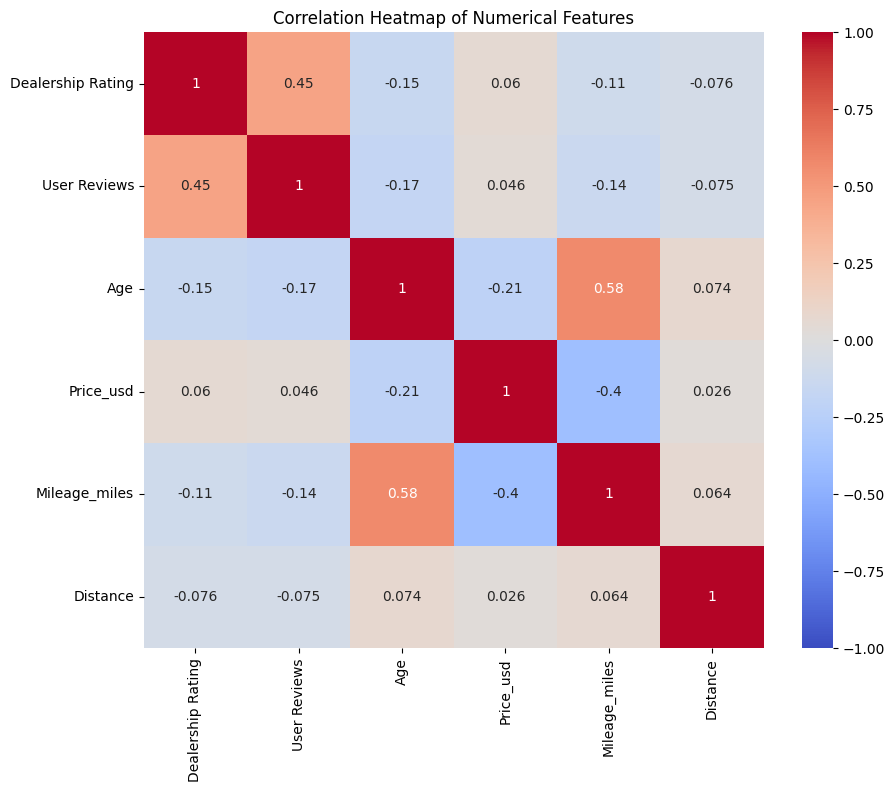

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numerical columns from the DataFrame
numerical_df = df_final.select_dtypes(include=['float64', 'int64'])


plt.figure(figsize=(10, 8))
sns.heatmap(numerical_df.corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Numerical Features')
plt.show()


## Feature Engineering

In [ ]:
# Checking for missing values
df_final.isnull().sum()

Dealer Name            2
Transmission Type      0
Drivetrain             0
Fuel Type              0
Dealership Rating    164
User Reviews         411
Year                   0
Make                   0
Model                  0
Age                    0
Price_usd            123
Mileage_miles          3
County               865
State                865
Distance             865
dtype: int64

In [ ]:
# Impute missing numerical values with the mean
df_final['Dealership Rating'].fillna(df_final['Dealership Rating'].mean(), inplace=True)
df_final['User Reviews'].fillna(df_final['User Reviews'].mean(), inplace=True)
df_final['Price_usd'].fillna(df_final['Price_usd'].mean(), inplace=True)


In [ ]:
# Checking for missing values
df_final.isnull().sum()

Dealer Name            2
Transmission Type      0
Drivetrain             0
Fuel Type              0
Dealership Rating      0
User Reviews           0
Year                   0
Make                   0
Model                  0
Age                    0
Price_usd              0
Mileage_miles          3
County               865
State                865
Distance             865
dtype: int64

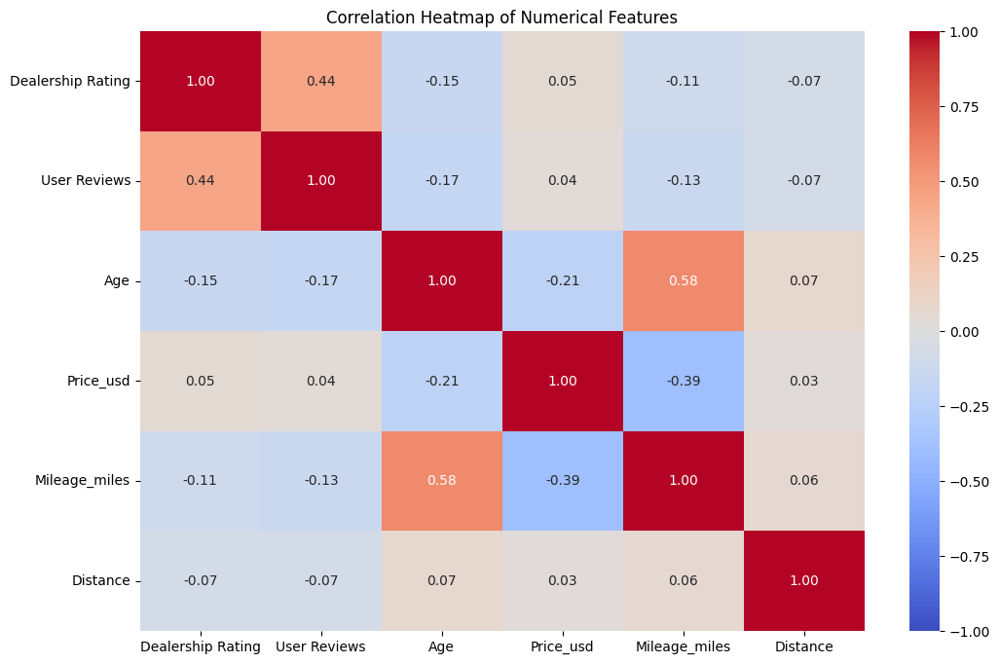

In [ ]:

# Selecting only numerical columns for correlation calculation
numerical_columns = df_final.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation matrix
correlation_matrix = numerical_columns.corr()


plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()


Correlation of numerical features with 'Price_usd':
 Price_usd            1.000000
Dealership Rating    0.051230
User Reviews         0.038846
Distance             0.025385
Age                 -0.211503
Mileage_miles       -0.393986
Name: Price_usd, dtype: float64


/var/folders/gp/2k7ydjgd1pvdz7fcbjx5rvs00000gn/T/ipykernel_78098/2274064344.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




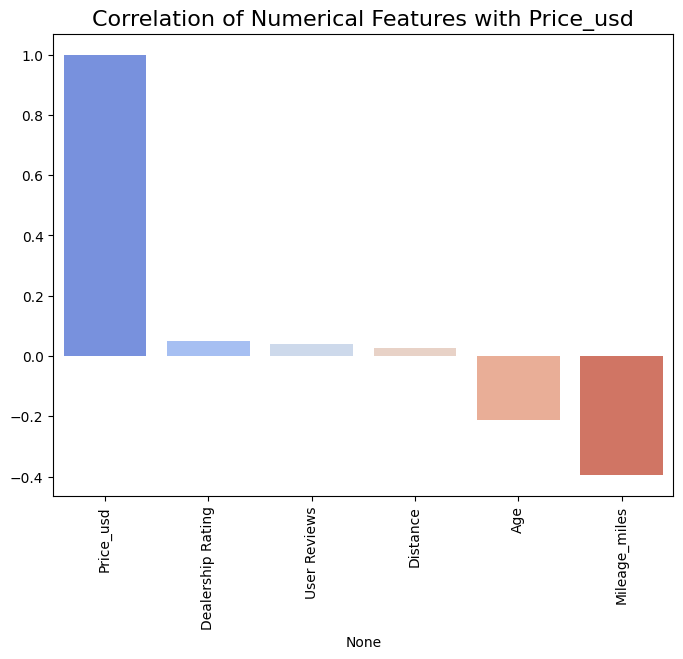

In [ ]:
# Select numerical columns
numerical_columns = df_final.select_dtypes(include=['float64', 'int64'])

# Calculate correlation of all numerical features with 'Price_usd'
correlation_with_price = numerical_columns.corr()['Price_usd'].sort_values(ascending=False)

# Display the correlation with 'Price_usd'
print("Correlation of numerical features with 'Price_usd':\n", correlation_with_price)

# Plotting correlation with 'Price_usd'
plt.figure(figsize=(8, 6))
sns.barplot(x=correlation_with_price.index, y=correlation_with_price.values, palette='coolwarm')
plt.title('Correlation of Numerical Features with Price_usd', fontsize=16)
plt.xticks(rotation=90)
plt.show()


Remove Unecessary columns - 'Dealership Rating', 'User Reviews','Distance','Year'

In [ ]:
df_final = df_final.drop(columns=['Dealership Rating', 'User Reviews','Distance','Year'])

In [ ]:
df_final.isnull().sum()

Dealer Name            2
Transmission Type      0
Drivetrain             0
Fuel Type              0
Make                   0
Model                  0
Age                    0
Price_usd              0
Mileage_miles          3
County               865
State                865
dtype: int64

In [ ]:

# Impute missing numerical values with the median
num_imputer = SimpleImputer(strategy='median')
df_final['Mileage_miles'] = num_imputer.fit_transform(df_final[['Mileage_miles']])


## Modeling

#### Label encodind for tree based model

In [ ]:
# For Tree-based models: Label Encoding
label_cols = ['Transmission Type', 'Drivetrain', 'Fuel Type', 'Make', 'Model', 'County', 'State', 'Dealer Name']
df_tree = df_final.copy()
label_encoders = {}

for col in label_cols:
    le = LabelEncoder()
    df_tree[col] = le.fit_transform(df_tree[col])
    label_encoders[col] = le

X_tree = df_tree.drop(['Price_usd'], axis=1)
y_tree = df_tree['Price_usd']

# Train-test split for tree-based models
X_train_tree, X_test_tree, y_train_tree, y_test_tree = train_test_split(X_tree, y_tree, test_size=0.2, random_state=42)


#### Defining all tree based algorithms

In [ ]:
models_tree_based = {
    'Decision Tree': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor(),
    'XGBoost': XGBRegressor(),
    'GradientBoostingRegressor' : GradientBoostingRegressor()
}

#### Train tree based models

In [ ]:
for name, model in models_tree_based.items():
    model.fit(X_train_tree, y_train_tree)
    y_pred = model.predict(X_test_tree)

    mse = mean_squared_error(y_test_tree, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test_tree, y_pred)
    r2 = r2_score(y_test_tree, y_pred)
    explained_variance = explained_variance_score(y_test_tree, y_pred)

    print(f"{name} - Mean Squared Error: {mse:.4f}")
    print(f"{name} - Root Mean Squared Error: {rmse:.4f}")
    print(f"{name} - Mean Absolute Error: {mae:.4f}")
    print(f"{name} - R-squared: {r2:.4f}")
    print(f"{name} - Explained Variance: {explained_variance:.4f}")
    print("-" * 50)


Decision Tree - Mean Squared Error: 307280140.8443
Decision Tree - Root Mean Squared Error: 17529.4079
Decision Tree - Mean Absolute Error: 7342.0050
Decision Tree - R-squared: 0.6177
Decision Tree - Explained Variance: 0.6178
--------------------------------------------------
Random Forest - Mean Squared Error: 168558572.0219
Random Forest - Root Mean Squared Error: 12983.0109
Random Forest - Mean Absolute Error: 5792.6358
Random Forest - R-squared: 0.7903
Random Forest - Explained Variance: 0.7904
--------------------------------------------------
XGBoost - Mean Squared Error: 142822268.5639
XGBoost - Root Mean Squared Error: 11950.8271
XGBoost - Mean Absolute Error: 5178.9287
XGBoost - R-squared: 0.8223
XGBoost - Explained Variance: 0.8223
--------------------------------------------------
GradientBoostingRegressor - Mean Squared Error: 191548884.4588
GradientBoostingRegressor - Root Mean Squared Error: 13840.1187
GradientBoostingRegressor - Mean Absolute Error: 7342.4641
GradientBo

- Highest accuracy with tree based model is 82.3 with XGBoost

#### Linear models: One-Hot Encoding

In [ ]:
# For Linear models: One-Hot Encoding
df_linear = pd.get_dummies(df_final, columns=label_cols, drop_first=True)
X_linear = df_linear.drop(['Price_usd'], axis=1)
y_linear = df_linear['Price_usd']
# Train-test split for linear models
X_train_linear, X_test_linear, y_train_linear, y_test_linear = train_test_split(X_linear, y_linear, test_size=0.2, random_state=42)


#### Define models for linear algorithms

In [ ]:
models_linear = {
    'Linear Regression': LinearRegression()
}

In [ ]:
# Train linear models (using One-Hot Encoded dataset)
for name, model in models_linear.items():
    model.fit(X_train_linear, y_train_linear)
    y_pred = model.predict(X_test_linear)

    mse = mean_squared_error(y_test_linear, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test_linear, y_pred)
    r2 = r2_score(y_test_linear, y_pred)
    explained_variance = explained_variance_score(y_test_linear, y_pred)

    print(f"{name} - Mean Squared Error: {mse:.4f}")
    print(f"{name} - Root Mean Squared Error: {rmse:.4f}")
    print(f"{name} - Mean Absolute Error: {mae:.4f}")
    print(f"{name} - R-squared: {r2:.4f}")
    print(f"{name} - Explained Variance: {explained_variance:.4f}")
    print("-" * 50)


Linear Regression - Mean Squared Error: 195456176.2879
Linear Regression - Root Mean Squared Error: 13980.5642
Linear Regression - Mean Absolute Error: 4782.6344
Linear Regression - R-squared: 0.7568
Linear Regression - Explained Variance: 0.7569
--------------------------------------------------


- Highest Accuracy with Linear Model - 75.69 %

#### Using Ensemble technique - Stacking Regressor with Linear Regression as Medta Model

In [ ]:

# Define base models
base_models = [
    ('decision_tree', DecisionTreeRegressor()),
    ('random_forest', RandomForestRegressor()),
    ('xgboost', XGBRegressor()),
    ('gradient_boosting', GradientBoostingRegressor())
]


# Define the meta-model
meta_model = LinearRegression()

# Create Stacking Regressor
stacked_model = StackingRegressor(estimators=base_models, final_estimator=meta_model)

# Train and evaluate the stacked model
stacked_model.fit(X_train_tree, y_train_tree)
y_pred_stacked = stacked_model.predict(X_test_tree)

# Evaluation metrics for the stacked model
mse_stacked = mean_squared_error(y_test_tree, y_pred_stacked)
rmse_stacked = np.sqrt(mse_stacked)
mae_stacked = mean_absolute_error(y_test_tree, y_pred_stacked)
r2_stacked = r2_score(y_test_tree, y_pred_stacked)
explained_variance_stacked = explained_variance_score(y_test_tree, y_pred_stacked)

print("Stacked Model - Mean Squared Error:", mse_stacked)
print("Stacked Model - Root Mean Squared Error:", rmse_stacked)
print("Stacked Model - Mean Absolute Error:", mae_stacked)
print("Stacked Model - R-squared:", r2_stacked)
print("Stacked Model - Explained Variance:", explained_variance_stacked)

Stacked Model - Mean Squared Error: 128815708.49121739
Stacked Model - Root Mean Squared Error: 11349.700810647715
Stacked Model - Mean Absolute Error: 5153.009978006329
Stacked Model - R-squared: 0.8397490264133378
Stacked Model - Explained Variance: 0.8397495473682566


- Highest accuracy of 83.6 achieved using Stacking regressor with linear regression as meta model

#### Tuning hyperparameter of tree models

In [ ]:
from sklearn.ensemble import StackingRegressor, GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score
import numpy as np

# Define base models with initial parameters, correcting the syntax error
base_models = [
    ('decision_tree', DecisionTreeRegressor()),
    ('random_forest', RandomForestRegressor()),
    ('xgboost', XGBRegressor()),
    ('gradient_boosting', GradientBoostingRegressor())
]

# Define the meta-model
meta_model = LinearRegression()

# Create the stacking regressor
stacked_model = StackingRegressor(
    estimators=base_models,
    final_estimator=meta_model,
    passthrough=True  # Pass original features to meta-model
)

# Parameter grid for RandomizedSearchCV
param_grid = {
    # Decision Tree
    'decision_tree__max_depth': [None, 5, 10, 20],
    'decision_tree__min_samples_split': [2, 5, 10],

    # Random Forest
    'random_forest__n_estimators': [100, 200],
    'random_forest__max_depth': [None, 5, 10],
    'random_forest__min_samples_split': [2, 5],

    # XGBoost
    'xgboost__n_estimators': [100, 200],
    'xgboost__learning_rate': [0.01, 0.1, 0.2],
    'xgboost__max_depth': [3, 5, 7],

    # Gradient Boosting
    'gradient_boosting__n_estimators': [100, 200],
    'gradient_boosting__learning_rate': [0.01, 0.1, 0.2],
    'gradient_boosting__max_depth': [3, 5, 7],
    'gradient_boosting__min_samples_split': [2, 5, 10],

    # Meta-Model (Linear Regression)
    'final_estimator__fit_intercept': [True, False]
}


# Use RandomizedSearchCV for tuning
random_search = RandomizedSearchCV(
    estimator=stacked_model,
    param_distributions=param_grid,
    n_iter=20,  # Number of parameter settings that are sampled
    cv=3,       # 3-fold cross-validation
    scoring='neg_mean_squared_error',
    verbose=2,
    n_jobs=-1,
    random_state=42
)

# Fit the RandomizedSearchCV
random_search.fit(X_train_tree, y_train_tree)

# Best parameters
print("Best Parameters:")
print(random_search.best_params_)

# Evaluate the tuned model
best_model = random_search.best_estimator_
y_pred_tuned = best_model.predict(X_test_tree)

# Evaluation metrics
mse_tuned = mean_squared_error(y_test_tree, y_pred_tuned)
rmse_tuned = np.sqrt(mse_tuned)
mae_tuned = mean_absolute_error(y_test_tree, y_pred_tuned)
r2_tuned = r2_score(y_test_tree, y_pred_tuned)
explained_variance_tuned = explained_variance_score(y_test_tree, y_pred_tuned)

print("\nTuned Stacked Model Performance:")
print(f"Mean Squared Error: {mse_tuned:.4f}")
print(f"Root Mean Squared Error: {rmse_tuned:.4f}")
print(f"Mean Absolute Error: {mae_tuned:.4f}")
print(f"R-squared: {r2_tuned:.4f}")
print(f"Explained Variance: {explained_variance_tuned:.4f}")


Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best Parameters:
{'xgboost__n_estimators': 100, 'xgboost__max_depth': 7, 'xgboost__learning_rate': 0.1, 'random_forest__n_estimators': 200, 'random_forest__min_samples_split': 2, 'random_forest__max_depth': 5, 'gradient_boosting__n_estimators': 100, 'gradient_boosting__min_samples_split': 5, 'gradient_boosting__max_depth': 5, 'gradient_boosting__learning_rate': 0.2, 'final_estimator__fit_intercept': False, 'decision_tree__min_samples_split': 10, 'decision_tree__max_depth': 10}

Tuned Stacked Model Performance:
Mean Squared Error: 122756686.4590
Root Mean Squared Error: 11079.5617
Mean Absolute Error: 4999.9078
R-squared: 0.8473
Explained Variance: 0.8473


- With Hyperparameter tuning achieved 84.73

##### Using different metal with tuned base tree models

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import Ridge, Lasso
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score
from sklearn.model_selection import cross_val_score
import numpy as np
import pandas as pd

# Define base models
base_models = [
     ('decision_tree', DecisionTreeRegressor(max_depth=10, min_samples_split=10)),  # Tuned parameters from previous run
    ('random_forest', RandomForestRegressor(n_estimators=200, max_depth=5, min_samples_split=2)),
    ('xgboost', XGBRegressor(n_estimators=100, max_depth=7, learning_rate=0.1)),
    ('gradient_boosting', GradientBoostingRegressor(n_estimators=200, learning_rate=0.2, max_depth=5))]

# Define meta-models and their hyperparameter grids
meta_models = {
    'Ridge': (Ridge(), {'alpha': [0.1, 1, 10, 100]}),
    'Lasso': (Lasso(), {'alpha': [0.01, 0.1, 1, 10]}),
    'Decision Tree': (DecisionTreeRegressor(), {'max_depth': [3, 5, 10], 'min_samples_split': [2, 5, 10]}),
    'Random Forest': (RandomForestRegressor(), {'n_estimators': [100, 200], 'max_depth': [3, 5, 10], 'min_samples_split': [2, 5]}),
    'XGBoost': (XGBRegressor(), {'n_estimators': [100, 200], 'max_depth': [3, 5, 7], 'learning_rate': [0.01, 0.1, 0.2]}),
    'Gradient Boosting': (GradientBoostingRegressor(), {'n_estimators': [100, 200], 'learning_rate': [0.01, 0.1, 0.2], 'max_depth': [3, 5], 'min_samples_split': [2, 5]})
}

results = []

# Iterate over meta-models
for name, (meta_model, param_grid) in meta_models.items():
    print(f"\n--- Tuning and Evaluating {name} as the Meta-Model ---")

    # Hyperparameter tuning using RandomizedSearchCV
    search = RandomizedSearchCV(
        estimator=meta_model,
        param_distributions=param_grid,
        n_iter=20,  # Number of parameter combinations to try
        scoring='neg_mean_squared_error',
        cv=3,  # 3-fold cross-validation
        verbose=2,
        random_state=42,
        n_jobs=-1
    )
    search.fit(X_train_tree, y_train_tree)

    # Best meta-model with tuned parameters
    best_meta_model = search.best_estimator_
    print(f"Best Parameters for {name}: {search.best_params_}")

    # Create the stacking regressor with the tuned meta-model
    stacked_model = StackingRegressor(
        estimators=base_models,
        final_estimator=best_meta_model,
        passthrough=True
    )

    # Cross-validation (5-fold)
    cv_scores = cross_val_score(stacked_model, X_train_tree, y_train_tree, cv=5, scoring='r2')
    mean_cv_r2 = np.mean(cv_scores)
    print(f"Cross-validated R2: {mean_cv_r2:.4f}")

    # Train the stacking regressor on the entire training set
    stacked_model.fit(X_train_tree, y_train_tree)

    # Predict on the test set
    y_pred_stacked = stacked_model.predict(X_test_tree)

    # Evaluate the model on the test set
    mse = mean_squared_error(y_test_tree, y_pred_stacked)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test_tree, y_pred_stacked)
    r2 = r2_score(y_test_tree, y_pred_stacked)
    explained_variance = explained_variance_score(y_test_tree, y_pred_stacked)

    # Print test set metrics
    print(f"Test Set R2: {r2:.4f}")
    print(f"Mean Squared Error: {mse:.4f}")
    print(f"Root Mean Squared Error: {rmse:.4f}")
    print(f"Mean Absolute Error: {mae:.4f}")
    print(f"Explained Variance: {explained_variance:.4f}")
    print("-" * 50)

    # Append results for comparison
    results.append({
        'Meta-Model': name,
        'CV R2': mean_cv_r2,
        'Test R2': r2,
        'Test MSE': mse,
        'Test RMSE': rmse,
        'Test MAE': mae,
        'Explained Variance': explained_variance
    })

# Save results in a DataFrame
results_df = pd.DataFrame(results)

# Display results
print("\nComparison of Meta-Models with Hyperparameter Tuning:")
print(results_df)

# Optional: Save results to a CSV file
results_df.to_csv('meta_model_results_tuned.csv', index=False)



--- Tuning and Evaluating Ridge as the Meta-Model ---
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best Parameters for Ridge: {'alpha': 10}


/Users/kaushikmanjunatha/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_search.py:307: UserWarning:

The total space of parameters 4 is smaller than n_iter=20. Running 4 iterations. For exhaustive searches, use GridSearchCV.



Cross-validated R2: 0.7572
Test Set R2: 0.8726
Mean Squared Error: 102435741.1693
Root Mean Squared Error: 10121.0544
Mean Absolute Error: 4632.5716
Explained Variance: 0.8726
--------------------------------------------------

--- Tuning and Evaluating Lasso as the Meta-Model ---
Fitting 3 folds for each of 4 candidates, totalling 12 fits


/Users/kaushikmanjunatha/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_search.py:307: UserWarning:

The total space of parameters 4 is smaller than n_iter=20. Running 4 iterations. For exhaustive searches, use GridSearchCV.



Best Parameters for Lasso: {'alpha': 0.01}
[CV] END decision_tree__max_depth=5, decision_tree__min_samples_split=10, final_estimator__fit_intercept=True, gradient_boosting__learning_rate=0.1, gradient_boosting__max_depth=5, gradient_boosting__min_samples_split=2, gradient_boosting__n_estimators=100, random_forest__max_depth=5, random_forest__min_samples_split=5, random_forest__n_estimators=200, xgboost__learning_rate=0.1, xgboost__max_depth=5, xgboost__n_estimators=100; total time=  34.2s
[CV] END decision_tree__max_depth=20, decision_tree__min_samples_split=10, final_estimator__fit_intercept=True, gradient_boosting__learning_rate=0.01, gradient_boosting__max_depth=5, gradient_boosting__min_samples_split=10, gradient_boosting__n_estimators=200, random_forest__max_depth=10, random_forest__min_samples_split=5, random_forest__n_estimators=100, xgboost__learning_rate=0.2, xgboost__max_depth=5, xgboost__n_estimators=100; total time=  52.5s
[CV] END decision_tree__max_depth=5, decision_tree_

[CV] END decision_tree__max_depth=10, decision_tree__min_samples_split=2, final_estimator__fit_intercept=True, gradient_boosting__learning_rate=0.1, gradient_boosting__max_depth=7, gradient_boosting__min_samples_split=2, gradient_boosting__n_estimators=200, random_forest__max_depth=10, random_forest__min_samples_split=5, random_forest__n_estimators=200, xgboost__learning_rate=0.01, xgboost__max_depth=7, xgboost__n_estimators=200; total time= 1.4min
[CV] END decision_tree__max_depth=5, decision_tree__min_samples_split=5, final_estimator__fit_intercept=False, gradient_boosting__learning_rate=0.1, gradient_boosting__max_depth=5, gradient_boosting__min_samples_split=2, gradient_boosting__n_estimators=100, random_forest__max_depth=5, random_forest__min_samples_split=5, random_forest__n_estimators=100, xgboost__learning_rate=0.01, xgboost__max_depth=3, xgboost__n_estimators=100; total time=  25.4s
[CV] END decision_tree__max_depth=10, decision_tree__min_samples_split=10, final_estimator__fit

/Users/kaushikmanjunatha/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_search.py:307: UserWarning:

The total space of parameters 9 is smaller than n_iter=20. Running 9 iterations. For exhaustive searches, use GridSearchCV.



Best Parameters for Decision Tree: {'min_samples_split': 5, 'max_depth': 10}
Cross-validated R2: 0.5301
Test Set R2: 0.7520
Mean Squared Error: 199332190.9036
Root Mean Squared Error: 14118.5053
Mean Absolute Error: 5238.1270
Explained Variance: 0.7521
--------------------------------------------------

--- Tuning and Evaluating Random Forest as the Meta-Model ---
Fitting 3 folds for each of 12 candidates, totalling 36 fits


/Users/kaushikmanjunatha/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_search.py:307: UserWarning:

The total space of parameters 12 is smaller than n_iter=20. Running 12 iterations. For exhaustive searches, use GridSearchCV.



Best Parameters for Random Forest: {'n_estimators': 200, 'min_samples_split': 2, 'max_depth': 10}
Cross-validated R2: 0.7463
[CV] END .max_depth=3, min_samples_split=2, n_estimators=200; total time=   2.9s
[CV] END .max_depth=5, min_samples_split=5, n_estimators=100; total time=   2.0s
[CV] END max_depth=10, min_samples_split=2, n_estimators=100; total time=   3.8s
[CV] END max_depth=10, min_samples_split=5, n_estimators=100; total time=   3.3s
[CV] END .max_depth=3, min_samples_split=2, n_estimators=200; total time=   2.9s
[CV] END .max_depth=5, min_samples_split=5, n_estimators=100; total time=   1.9s
[CV] END .max_depth=5, min_samples_split=5, n_estimators=200; total time=   4.3s
[CV] END max_depth=10, min_samples_split=5, n_estimators=100; total time=   3.3s
[CV] END decision_tree__max_depth=5, decision_tree__min_samples_split=10, final_estimator__fit_intercept=False, gradient_boosting__learning_rate=0.01, gradient_boosting__max_depth=7, gradient_boosting__min_samples_split=10, gra

[CV] END .max_depth=3, min_samples_split=5, n_estimators=100; total time=   1.1s
[CV] END .max_depth=5, min_samples_split=2, n_estimators=100; total time=   2.4s
[CV] END .max_depth=5, min_samples_split=5, n_estimators=200; total time=   4.3s
[CV] END max_depth=10, min_samples_split=2, n_estimators=200; total time=   6.5s
[CV] END decision_tree__max_depth=5, decision_tree__min_samples_split=10, final_estimator__fit_intercept=False, gradient_boosting__learning_rate=0.01, gradient_boosting__max_depth=7, gradient_boosting__min_samples_split=10, gradient_boosting__n_estimators=100, random_forest__max_depth=10, random_forest__min_samples_split=2, random_forest__n_estimators=200, xgboost__learning_rate=0.1, xgboost__max_depth=7, xgboost__n_estimators=100; total time= 1.0min
[CV] END decision_tree__max_depth=5, decision_tree__min_samples_split=10, final_estimator__fit_intercept=True, gradient_boosting__learning_rate=0.01, gradient_boosting__max_depth=7, gradient_boosting__min_samples_split=5,

[CV] END .max_depth=3, min_samples_split=2, n_estimators=100; total time=   1.1s
[CV] END .max_depth=5, min_samples_split=2, n_estimators=100; total time=   2.4s
[CV] END .max_depth=5, min_samples_split=5, n_estimators=200; total time=   4.5s
[CV] END max_depth=10, min_samples_split=5, n_estimators=100; total time=   3.4s
[CV] END max_depth=10, min_samples_split=5, n_estimators=200; total time=   5.7s
Test Set R2: 0.8570
Mean Squared Error: 114936696.8247
Root Mean Squared Error: 10720.8534
Mean Absolute Error: 4661.0382
Explained Variance: 0.8570
--------------------------------------------------

--- Tuning and Evaluating XGBoost as the Meta-Model ---
Fitting 3 folds for each of 18 candidates, totalling 54 fits


/Users/kaushikmanjunatha/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_search.py:307: UserWarning:

The total space of parameters 18 is smaller than n_iter=20. Running 18 iterations. For exhaustive searches, use GridSearchCV.



Best Parameters for XGBoost: {'n_estimators': 200, 'max_depth': 5, 'learning_rate': 0.2}
Cross-validated R2: 0.7408
Test Set R2: 0.8049
Mean Squared Error: 156792107.4470
Root Mean Squared Error: 12521.6655
Mean Absolute Error: 4796.6879
Explained Variance: 0.8049
--------------------------------------------------

--- Tuning and Evaluating Gradient Boosting as the Meta-Model ---
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best Parameters for Gradient Boosting: {'n_estimators': 200, 'min_samples_split': 5, 'max_depth': 5, 'learning_rate': 0.2}
Cross-validated R2: 0.7144
Test Set R2: 0.8580
Mean Squared Error: 114155835.9470
Root Mean Squared Error: 10684.3734
Mean Absolute Error: 4500.7802
Explained Variance: 0.8580
--------------------------------------------------

Comparison of Meta-Models with Hyperparameter Tuning:
          Meta-Model     CV R2   Test R2      Test MSE     Test RMSE   
0              Ridge  0.757248  0.872567  1.024357e+08  10121.054351  \
1      

#### Residual Analysis

In [ ]:
residuals = y_test_tree - y_pred_stacked


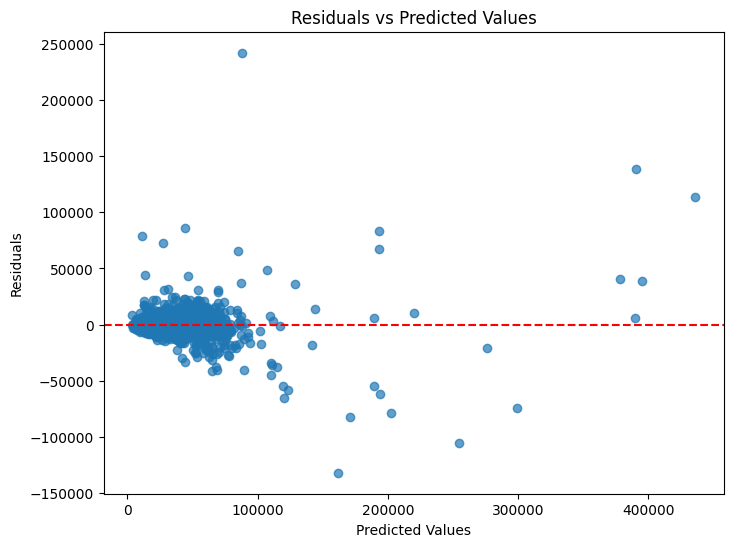

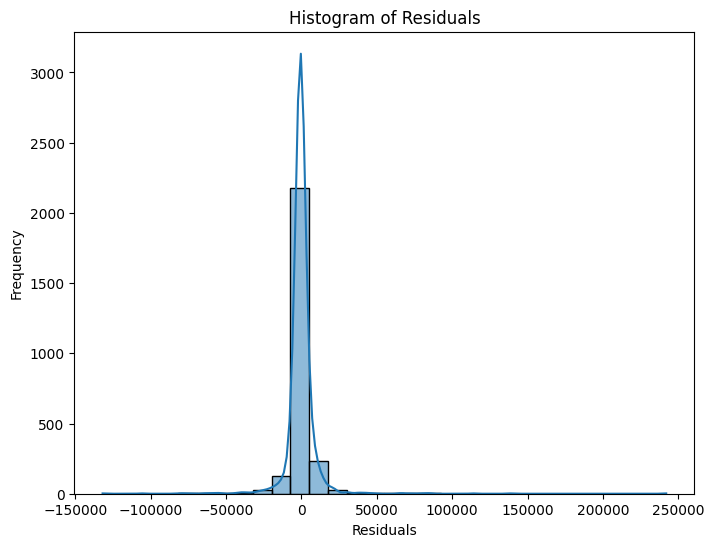

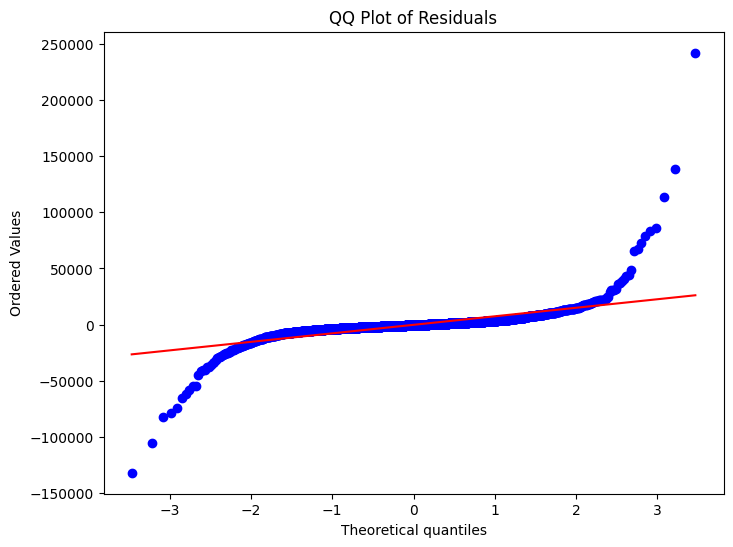

Mean of Residuals: -168.6912


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

# Residual Calculation
residuals = y_test_tree - y_pred_stacked

# Residuals vs Predicted Values
plt.figure(figsize=(8, 6))
plt.scatter(y_pred_stacked, residuals, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted Values')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

# Histogram of Residuals
plt.figure(figsize=(8, 6))
sns.histplot(residuals, kde=True, bins=30)
plt.title('Histogram of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

# QQ Plot for Residual Normality
plt.figure(figsize=(8, 6))
stats.probplot(residuals, dist="norm", plot=plt)
plt.title('QQ Plot of Residuals')
plt.show()

# Print Residual Metrics
print(f"Mean of Residuals: {np.mean(residuals):.4f}")


#### Residuals vs. Predicted Values
Observation: The residuals are spread out around the horizontal axis (0), but there seem to be some outliers and patterns, especially for larger predicted values.
Conclusion: While the model captures the overall trend, it might struggle with higher predictions. This could indicate heteroscedasticity (increasing variance with larger predictions).

#### Histogram of Residuals
Observation: Residuals are roughly centered around zero, but there is some skewness, and the tails are heavy.
Conclusion: The residuals are not perfectly normally distributed, which might impact the assumptions of the linear regression model  (Lasso).

#### QQ Plot
Observation: The residuals deviate significantly from the red line, especially in the tails, indicating non-normality.
Conclusion: There are extreme outliers that the model may not handle well. This could be due to unmodeled non-linear relationships or noisy data.

#### Mean of Residuals
Value: The mean of residuals is approximately -305.
Conclusion: This is close to zero, indicating no significant bias in the predictions overall, but it’s slightly off, which could be improved with further adjustments.

In [ ]:
X_train_tree.dtypes

Dealer Name            int64
Transmission Type      int64
Drivetrain             int64
Fuel Type              int64
Make                   int64
Model                  int64
Age                    int64
Mileage_miles        float64
County                 int64
State                  int64
dtype: object

## Stream Lit Deployment

In [ ]:
from sklearn.preprocessing import LabelEncoder
import pickle

# List of categorical columns to encode
label_cols = ['Transmission Type', 'Drivetrain', 'Fuel Type', 'County', 'State', 'Dealer Name','Model','Make']

# Create a copy of the data
df_tree_xg = df_final.copy()



# Dictionary to store LabelEncoders
label_encoders = {}

# Apply Label Encoding and store encoders
for col in label_cols:
    le = LabelEncoder()
    df_tree_xg[col] = le.fit_transform(df_tree_xg[col])
    label_encoders[col] = le

# Save the encoders to a file
with open("label_encoders.pkl", "wb") as f:
    pickle.dump(label_encoders, f)

print("Label encoders saved successfully!")

Label encoders saved successfully!


In [ ]:


X_tree_xg = df_tree_xg.drop(['Price_usd'], axis=1)
y_tree_xg = df_tree_xg['Price_usd']

# Train-test split for tree-based models
X_train_tree_xg, X_test_tree_xg, y_train_tree_xg, y_test_tree_xg = train_test_split(X_tree_xg, y_tree_xg, test_size=0.2, random_state=42)


Dealer Name: 0.0496
Transmission Type: 0.0863
Drivetrain: 0.1514
Fuel Type: 0.0617
Make: 0.1437
Model: 0.1075
Age: 0.0652
Mileage_miles: 0.1653
County: 0.1099
State: 0.0595


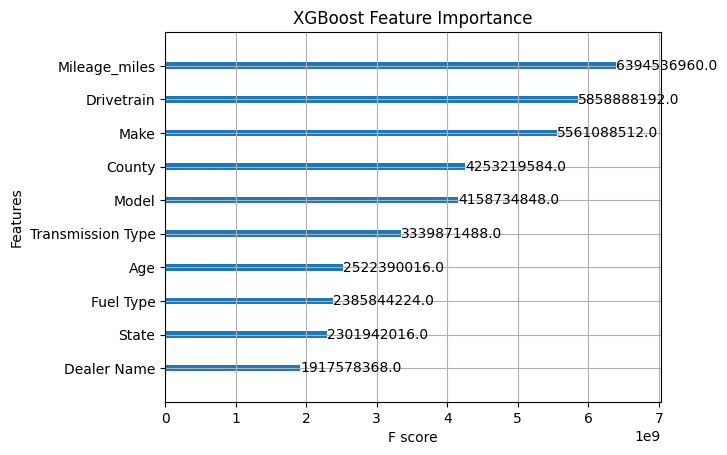

In [ ]:
import matplotlib.pyplot as plt
import xgboost as xgb

# Fit XGBoost model
xgboost_model = xgb.XGBRegressor(n_estimators=100, max_depth=7, learning_rate=0.1)
xgboost_model.fit(X_train_tree_xg, y_train_tree_xg)

# Feature importance
feature_importances = xgboost_model.feature_importances_

# Display feature importance
features = X_train_tree.columns
for feature, importance in zip(features, feature_importances):
    print(f"{feature}: {importance:.4f}")

# Plot feature importance
xgb.plot_importance(xgboost_model, max_num_features=10, importance_type='gain')  # Top 10 features
plt.title('XGBoost Feature Importance')
plt.show()


In [ ]:
# Generate predictions for the test set
y_pred_xgb = xgboost_model.predict(X_test_tree_xg)

# Evaluate the model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score

mse = mean_squared_error(y_test_tree_xg, y_pred_xgb)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_tree_xg, y_pred_xgb)
r2 = r2_score(y_test_tree_xg, y_pred_xgb)
explained_variance = explained_variance_score(y_test_tree_xg, y_pred_xgb)

# Print evaluation metrics
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-squared (R2): {r2:.4f}")
print(f"Explained Variance: {explained_variance:.4f}")


Mean Squared Error (MSE): 132706694.7362
Root Mean Squared Error (RMSE): 11519.8392
Mean Absolute Error (MAE): 5164.8019
R-squared (R2): 0.8349
Explained Variance: 0.8349


In [ ]:
import pickle

# Save the XGBoost model
with open('xgboost_model.pkl', 'wb') as file:
    pickle.dump(xgboost_model, file)

# Save the Label Encoders (if needed for preprocessing)
with open('label_encoders.pkl', 'wb') as file:
    pickle.dump(label_encoders, file)


In [ ]:
# Load the XGBoost model
with open('xgboost_model.pkl', 'rb') as file:
    loaded_model = pickle.load(file)

# Load the Label Encoders (if applicable)
with open('label_encoders.pkl', 'rb') as file:
    loaded_label_encoders = pickle.load(file)


In [ ]:
# Input values for prediction
input_data = {
    'Dealer Name': 'Auto Group Exchange',
    'Transmission Type': 'Automatic',
    'Drivetrain': 'Front-Wheel Drive',
    'Fuel Type': 'Gasoline',
    'Make': 'Toyota',
    'Model': 'Camry Hybrid SE',
    'Age': 9,
    'Mileage_miles': 50000,
    'County': 'Baltimore',
    'State': 'MD'
}

# Apply label encoding to categorical features
for col, le in loaded_label_encoders.items():
    if col in input_data:
        input_data[col] = le.transform([input_data[col]])[0]

# Create input as a DataFrame
import pandas as pd
input_df = pd.DataFrame([input_data])

# Predict the price
predicted_price = loaded_model.predict(input_df)
print(f"Predicted Car Price: ${predicted_price[0]:,.2f}")


Predicted Car Price: $15,807.51
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   0.3s
[CV] END ..learning_rate=0.01, max_depth=7, n_estimators=100; total time=   0.6s
[CV] END ...learning_rate=0.1, max_depth=3, n_estimators=200; total time=   0.2s
[CV] END ...learning_rate=0.1, max_depth=5, n_estimators=200; total time=   0.4s
[CV] END ...learning_rate=0.1, max_depth=7, n_estimators=200; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=3, min_samples_split=2, n_estimators=100; total time=   1.1s
[CV] END learning_rate=0.2, max_depth=3, min_samples_split=5, n_estimators=100; total time=   1.1s
[CV] END learning_rate=0.1, max_depth=3, min_samples_split=2, n_estimators=200; total time=   2.7s
[CV] END learning_rate=0.2, max_depth=5, min_samples_split=2, n_estimators=200; total time=   5.5s
[CV] END learning_rate=0.1, max_depth=5, min_samples_split=2, n_estimators=100; total time=   2.7s
[CV] END learning_rate=0.01, max_depth=5, min_samples_split=2, n_est